In [1]:
import pandas as pd
import numpy as np
import os
import seaborn
from datetime import datetime
import time
import math
import matplotlib.pyplot as plt
import gc
import altair as alt
from sklearn.metrics.pairwise import euclidean_distances

# alt.data_transformers.enable("vegafusion") # enable large dataset optimization
alt.data_transformers.disable_max_rows() # allow datasets larger than 100k rows

DataTransformerRegistry.enable('default')

## Dataset import/cleaning

In [2]:
pb_only = True # SET TO TRUE TO USE ONLY PERSONAL BEST RECORDS

record_df = pd.DataFrame()
if not pb_only:
    # full record dataset
    record_df = pd.read_csv("out/all_records_pt_1.csv", index_col=[0])
    record_df = pd.concat([record_df, pd.read_csv("out/all_records_pt_2.csv", index_col=[0])], ignore_index=True)
else:
    # pb records only
    record_df = pd.read_csv("out/all_pbs.csv", index_col=[0])
    record_df = record_df.reset_index(drop=True)

# full user dataset
user_df = pd.read_csv("out/all_user_info.csv", index_col=[0])
user_df = user_df.reset_index(drop=True)

In [3]:
# construct more attributes
record_df["kps"] = record_df["inputs"] / (record_df["final_time"] / 1000) # keys per second
record_df["kpp"] = record_df["inputs"] / record_df["pieces_placed"] # keys per piece
record_df["percent_perf"] = record_df["finesse_perf"] / record_df["pieces_placed"] # percent of pieces placed with perfect finesse

In [4]:
# calculate time since account creation (users)
def calcTimePlayed(x):
    if x and isinstance(x, str):
        return time.time() - datetime.fromisoformat(x).timestamp()
    else:
        return math.nan
    
user_df["time_played"] = user_df["created_date"].apply(calcTimePlayed) # time since account creation

In [5]:
# drop the three records with over 5k finesse faults
crazy_outliers = record_df.loc[record_df["finesse_faults"] > 5000].index

for crazy_outlier in crazy_outliers:
    record_df = record_df.drop(crazy_outlier)

## Construct user attributes from records

In [6]:
# construct record-based user attrs
attrs_to_grab = ["datetime", "final_time","pps","inputs","score","pieces_placed","singles","doubles","triples","quads","all_clears","finesse_faults","finesse_perf", "percent_perf", "kpp", "kps"]

for attr in attrs_to_grab:
    user_df = user_df.merge(record_df.groupby(by=["user_id"])[[attr]].max().rename(columns={attr: attr+'_pb'}), left_on="id", right_on="user_id")

In [7]:
# explicitly delete and garbage-collect the records dataframe to reduce memory overhead
del record_df
gc.collect()

0

In [8]:
user_df = user_df.dropna()

In [9]:
user_df["best_time"] = user_df["best_time"].apply(lambda x: x/1000)

In [10]:
# alt.Chart(user_df.loc[user_df['datetime_pb'] >= '2023-01-01T00:00:00.000Z'].sample(10000)).mark_circle(fillOpacity=.25).encode(
#     alt.X('best_time', scale=alt.Scale(reverse=True)),
#     alt.Y('percent_perf_pb'),
#     color=alt.Color('rank', scale=alt.Scale(scheme="turbo")),
#     tooltip=['percent_perf_pb', 'best_time', 'username']
# ).interactive()

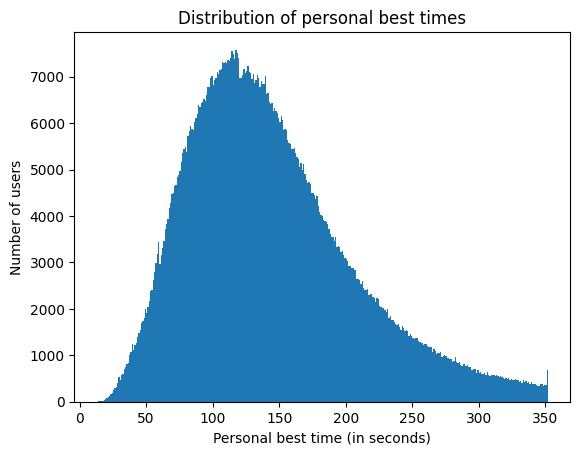

In [11]:
plt.hist(user_df["cohort"], bins=range(13, 353))
plt.title("Distribution of personal best times")
plt.xlabel("Personal best time (in seconds)")
plt.ylabel("Number of users")
plt.show()

In [12]:
# alt.Chart(user_df['cohort'].reset_index()).mark_bar().encode(
#     x = alt.X('cohort:N', scale=alt.Scale(reverse=True)),
#     y='count()',
#     tooltip=['cohort', 'count()']
# ).properties(
#     width=1200,
#     height=300
# ).interactive()

In [13]:
grp = user_df['cohort'].reset_index().groupby('cohort').count().reset_index()
grp.head()

,cohort,index
0,13,1
1,14,6
2,15,15
3,16,13
4,17,26


In [14]:
grp.loc[grp['cohort'].isin([119,120])]

,cohort,index
106,119,7408
107,120,6979


In [15]:
multi_dists = euclidean_distances([user_df.select_dtypes(include=np.number).loc[user_df['cohort'] == 119].mean()], [user_df.select_dtypes(include=np.number).loc[user_df['cohort'] == 120].mean()])
# dists = []
# for dist in multi_dists:
#     dists.append(math.sqrt(sum(dist)))

# sum(dists)/len(dists)


In [16]:
multi_dists

array([[798578.981]])

In [17]:
nearby = user_df.loc[(user_df['cohort'] >= 99) & (user_df['cohort'] <= 140)]
nearby['relative'] = nearby['cohort'].apply(lambda x: 'better' if x <= 119 else 'worse')

/tmp/ipykernel_1822268/3247393849.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nearby['relative'] = nearby['cohort'].apply(lambda x: 'better' if x <= 119 else 'worse')


In [18]:
nearby['best_time'] = nearby['best_time'].apply(lambda x: x/1000)

/tmp/ipykernel_1822268/3948967121.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nearby['best_time'] = nearby['best_time'].apply(lambda x: x/1000)


In [19]:
nearby.columns

Index(['id', 'username', 'rank', 'cohort', 'best_time', 'best_record',
       'country', 'created_date', 'xp', 'achievement_rating',
       'TL_games_played', 'TL_games_won', 'TL_play_time', 'num_records',
       'time_played', 'datetime_pb', 'final_time_pb', 'pps_pb', 'inputs_pb',
       'score_pb', 'pieces_placed_pb', 'singles_pb', 'doubles_pb',
       'triples_pb', 'quads_pb', 'all_clears_pb', 'finesse_faults_pb',
       'finesse_perf_pb', 'percent_perf_pb', 'kpp_pb', 'kps_pb', 'relative'],
      dtype='object')

In [20]:
alt.Chart(nearby.sample(10000)).mark_circle(fillOpacity=.25).encode(
    x = alt.X('best_time', scale=alt.Scale(reverse=True, domainMin=90, domainMax=150)),
    y = 'kps_pb',
    color=alt.Color('relative')
).interactive()

alt.Chart(...)

In [21]:
alt.Chart(nearby.sample(10000)).mark_circle(fillOpacity=.25).encode(
    alt.X('best_time', scale=alt.Scale(reverse=True, domainMin=90, domainMax=150)),
    alt.Y(alt.repeat("column"), type='quantitative'),
    color=alt.Color('relative')
).repeat(
    column=['xp', 'achievement_rating','TL_games_played', 'TL_games_won', 'TL_play_time', 'num_records','time_played', 'final_time_pb', 'pps_pb', 'inputs_pb', 'score_pb','pieces_placed_pb', 'singles_pb', 'doubles_pb', 'triples_pb','quads_pb', 'all_clears_pb', 'finesse_faults_pb', 'finesse_perf_pb','percent_perf_pb', 'kpp_pb', 'kps_pb']
).interactive()

alt.RepeatChart(...)